In [1]:
import pandas as pd
import numpy as np
from pynm.pynm import PyNM
import seaborn as sns
import matplotlib.pyplot as plt

import patsy as pat
import statsmodels.api as sm
import time

## **Big Data**
Approximation to GP model for large datasets
- Deep learning training process to fit data
    - num_epochs 
    - batch_size
    - n_inducing

## **Example**

In [4]:
def g(age, sex, offset, prob = False):
    noise = np.random.normal(0, 0.1)
    if prob:
        return 0.001*age-0.00001*(age-50)**2+0.5 + noise - np.random.uniform(0, 0.3) * sex - 0.2 * np.random.uniform() + offset
    else:
        return 0.001*age-0.00001*(age-50)**2+0.5 + noise - np.random.uniform(0, 0.3) * sex + offset

def dataset_multivariate(n_sites=5,sample_size=35,seed=650):
    np.random.seed(seed)
    n_sites = n_sites
    age_min = (np.random.rand(n_sites)*50).astype(int)
    sites = pd.DataFrame(data={'sex_ratio': np.random.rand(n_sites),
                               'prob_ratio': 0.5*np.random.rand(n_sites),
                               'age_min': age_min,
                               'age_max': (age_min+5+np.random.rand(n_sites)*50).astype(int),
                               'score_shift': np.random.randn(n_sites)/4,
                               'sample_size': (sample_size+np.random.rand(n_sites)*sample_size*10).astype(int)})

    participants = []
    for site in sites.iterrows():
        for participant in range(int(site[1]['sample_size'])):
            sex = np.random.binomial(1, site[1]['sex_ratio'])
            prob = np.random.binomial(1, site[1]['prob_ratio'])
            age = np.random.uniform(site[1]['age_min'], site[1]['age_max'])
            score = g(age, sex, site[1]['score_shift'],prob=prob)
            participants.append([site[0], sex, prob, age, score])

    df = pd.DataFrame(participants, columns=['site', 'sex', 'status', 'age', 'score'])
    return df

In [24]:
# Create a dataset
df = dataset_multivariate(n_sites=3,sample_size=100,seed=100)
print('n subjects = {}'.format(df.shape[0]))

n subjects = 2488


### Visualize data

Text(0.5, 1.0, 'By sex')

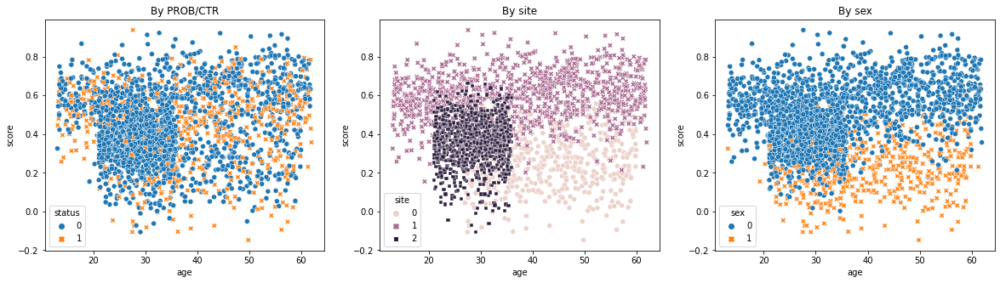

In [8]:
fig,ax = plt.subplots(1,3,figsize=(20,5))

sns.scatterplot(data=df, x='age', y='score', hue='status', style='status',ax=ax[0])
sns.scatterplot(data=df, x='age', y='score', hue='site', style='site',ax=ax[1])
sns.scatterplot(data=df, x='age', y='score', hue='sex', style='sex',ax=ax[2])

ax[0].set_title('By PROB/CTR')
ax[1].set_title('By site')
ax[2].set_title('By sex')

In the case of categorical confounds, it is useful to take a look at the distribution of the data within each category using violin plots. Here we can clearly see the offset in score associated with each site and sex. This will serve as a useful point of comparison when we take a look at the deviance scores from our models.

Text(0.5, 1.0, 'By sex')

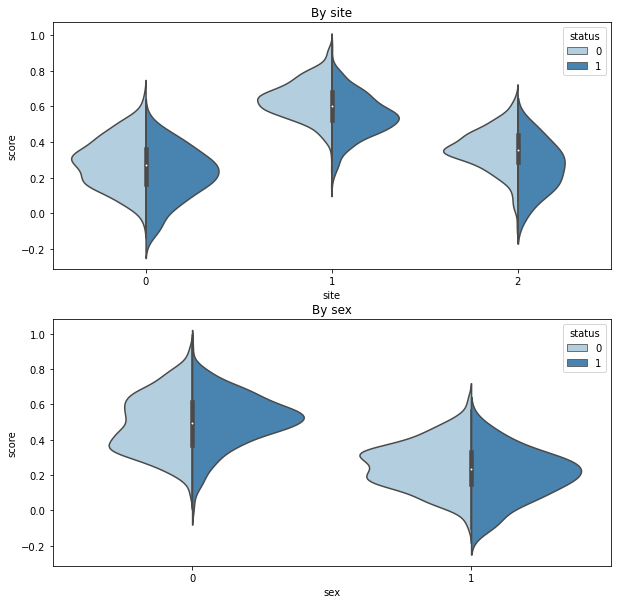

In [9]:
fig,ax = plt.subplots(2,1,figsize=(10,10))

sns.violinplot(x='site',y='score',data=df,split=True,palette='Blues',hue='status',ax=ax[0])
sns.violinplot(x='sex',y='score',data=df,split=True,palette='Blues',hue='status',ax=ax[1])

ax[0].set_title('By site')
ax[1].set_title('By sex')

### Fit exact GP model

In [11]:
# Initialize pynm w/ data, confounds
m = PyNM(df,'score','status',['age','c(sex)','c(site)'])

Models will be fit on full set of controls.


By default PyNM decided if it should use the exact or approximate GP model based on the number of subjects in the dataset. Here we will force it to use the exact model with the `method` parameter and we will receive a warning.

In [17]:
# Run & time model
start = time.time()

m.gp_normative_model(method='exact')

dur = time.time() - start

print('Model fit in {:.3f}s'.format(dur))

/home/harveyaa/Documents/masters/PyNM/pynm/pynm.py:483: Warning: Exact GP model with over 2000 data points requires large amounts of time and memory, continuing with exact model.
  "large amounts of time and memory, continuing with exact model.",Warning)


Model fit in 30.226s


/home/harveyaa/Documents/masters/PyNM/pynm/pynm.py:492: UserWarning: The residuals are not Gaussian!
  warnings.warn("The residuals are not Gaussian!")
/home/harveyaa/Documents/masters/PyNM/pynm/pynm.py:498: UserWarning: The residuals are heteroskedastic!
  warnings.warn("The residuals are heteroskedastic!")


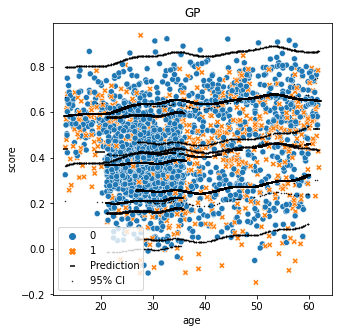

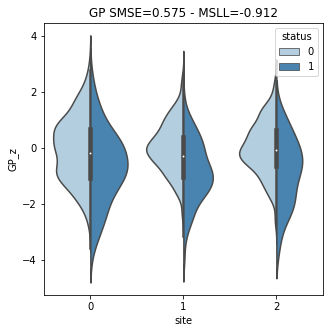

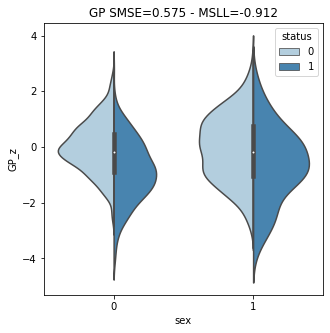

In [22]:
# Plot the data, model prediction, & 95% confidence interval
m.plot()

# Plot the z-scores of the model (model residuals / std deviation)
m.plot_z(confound='site')
m.plot_z(confound='sex')

### Fit approximate GP with default hyperparameters

In [18]:
# Initialize pynm w/ data, confounds
m_approx = PyNM(df,'score','status',['age','c(sex)','c(site)'])

Models will be fit on full set of controls.


We already gain significant speed over the exact model on a dataset of a couple thousand subjects!

In [19]:
# Run & time model
start = time.time()

m_approx.gp_normative_model(method='approx')

dur = time.time() - start

print('Model fit in {:.3f}s'.format(dur))

Epoch: 100%|██████████| 20/20 [00:11<00:00,  1.72it/s]


Model fit in 12.140s


/home/harveyaa/Documents/masters/PyNM/pynm/pynm.py:492: UserWarning: The residuals are not Gaussian!
  warnings.warn("The residuals are not Gaussian!")
/home/harveyaa/Documents/masters/PyNM/pynm/pynm.py:498: UserWarning: The residuals are heteroskedastic!
  warnings.warn("The residuals are heteroskedastic!")


However, looking at the model fit we can see that we are overfitting our data. We an adjust the fit using the hyperparameters `num_epochs`, `batch_size`, and `n_inducing`.

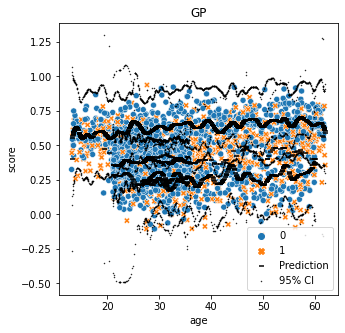

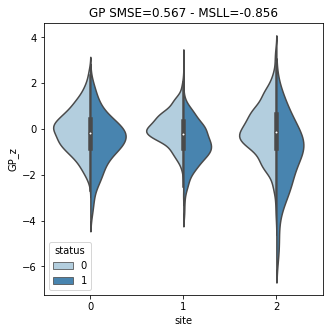

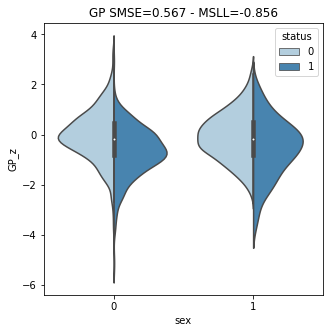

In [23]:
# Plot the data, model prediction, & 95% confidence interval
m_approx.plot()

# Plot the z-scores of the model (model residuals / std deviation)
m_approx.plot_z(confound='site')
m_approx.plot_z(confound='sex')

### Fit approximate GP with custom hyperparameters

In [26]:
# Initialize pynm w/ data, confounds
m_approx2 = PyNM(df,'score','status',['age','c(sex)','c(site)'])

Models will be fit on full set of controls.


In [36]:
# Run & time model
start = time.time()

m_approx2.gp_normative_model(method='approx',num_epochs=30,batch_size=128,n_inducing=1000)

dur = time.time() - start

print('Model fit in {:.3f}s'.format(dur))

Epoch: 100%|██████████| 30/30 [01:51<00:00,  3.70s/it]


Model fit in 111.803s


/home/harveyaa/Documents/masters/PyNM/pynm/pynm.py:492: UserWarning: The residuals are not Gaussian!
  warnings.warn("The residuals are not Gaussian!")
/home/harveyaa/Documents/masters/PyNM/pynm/pynm.py:498: UserWarning: The residuals are heteroskedastic!
  warnings.warn("The residuals are heteroskedastic!")


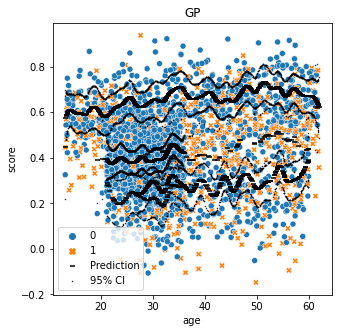

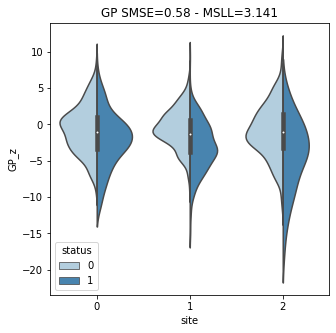

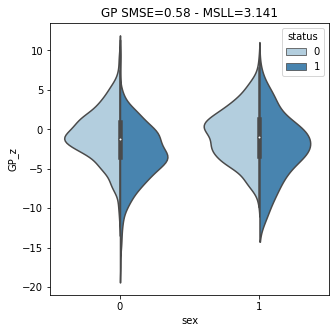

In [37]:
# Plot the data, model prediction, & 95% confidence interval
m_approx2.plot()

# Plot the z-scores of the model (model residuals / std deviation)
m_approx2.plot_z(confound='site')
m_approx2.plot_z(confound='sex')

### Fit approximate GP on very large dataset

In [14]:
# Create a dataset
df_xl = dataset_multivariate(n_sites=3,sample_size=1000,randseed=100)
print('n subjects = {}'.format(df_xl.shape[0]))

n subjects = 24893


In [ ]:
fig,ax = plt.subplots(1,3,figsize=(20,5))

sns.scatterplot(data=df, x='age', y='score', hue='status', style='status',ax=ax[0])
sns.scatterplot(data=df, x='age', y='score', hue='site', style='site',ax=ax[1])
sns.scatterplot(data=df, x='age', y='score', hue='sex', style='sex',ax=ax[2])

ax[0].set_title('By PROB/CTR')
ax[1].set_title('By site')
ax[2].set_title('By sex')

In [15]:
#Initialize pynm w/ data and confounds
m_xl = PyNM(df_xl,'score','status',['age','C(sex)','C(site)']) #multivarite confounds for GP model

Fitting model on full set of controls...


In [16]:
# Run & time model
start = time.time()

m_xl.gp_normative_model(method='approx')

dur = time.time() - start

print('Model fit in {:.3f}s'.format(dur))

, loss=-.745]
Epoch: 100%|██████████| 20/20 [02:25<00:00,  7.26s/it]
146.79858136177063


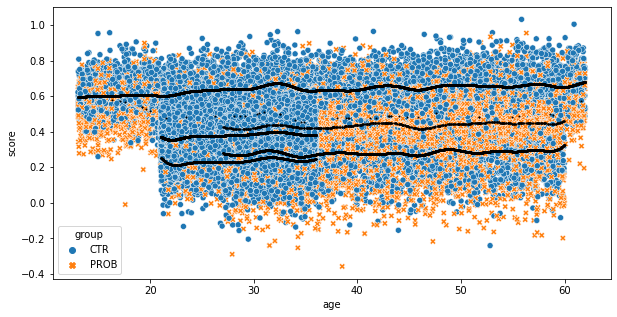

In [18]:
plt.figure(figsize=(10,5))

sns.scatterplot(data=m_xl.data, x='age', y='score',
                             hue='group', style='group')

tmp = m_xl.data.sort_values('age')
plt.scatter(tmp['age'], tmp['GP_pred'],color='black',s=1)